In [1]:
import os
import cv2
import glob
import json
import numpy as np
import pandas as pd
import time, math
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
result_dataset = {}
result_dataset_avg = {}
for file_path, dir_list, file_list in os.walk(r'/root/autodl-tmp/DL/RESULT/'):
    for dir_name in dir_list:
        result_dir = os.path.join(file_path, dir_name)
        result_json_list = glob.glob(os.path.join(result_dir, "*.json"))
        result_json_list.sort()

        result_data = {}
        for result_json in result_json_list:
            file_dir, file_name = os.path.split(result_json)
            file_name, file_ext = os.path.splitext(file_name)
            with open(result_json, 'r') as f:
                result_list = json.load(f)
                if not dir_name in result_dataset:
                    result_dataset[dir_name] ={}
                result_dataset[dir_name][file_name] = result_list
                result_avg = {}
                for img, result in result_list.items():
                    for eval_algo, scale_list in result.items():
                        for scale, source in scale_list.items():
                            img_path = source[0]
                            img_source = source[1]
                            if not eval_algo in result_avg:
                                result_avg[eval_algo] = {}
                            if not scale in result_avg[eval_algo]:
                                result_avg[eval_algo][scale] = []
                            result_avg[eval_algo][scale].append(img_source)
                for eval_algo, scale_list in result_avg.items():
                    for scale in scale_list.keys():
                        scale_list[scale] = np.mean(scale_list[scale])
                result_data[file_name] = result_avg
        result_dataset_avg[dir_name] = result_data


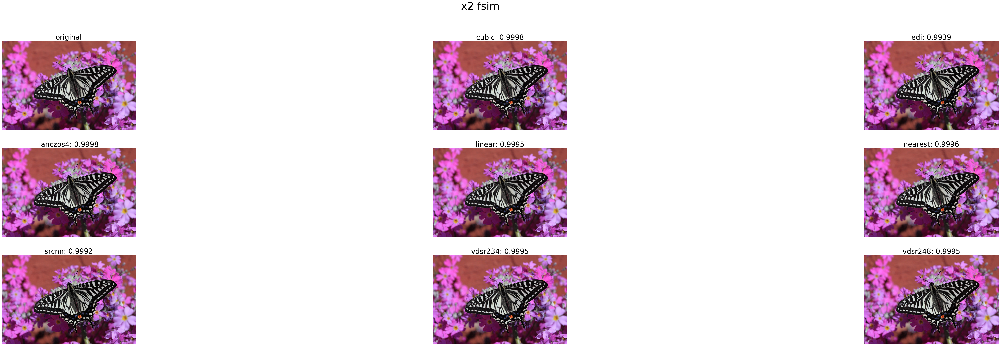

In [3]:
show_eval_algo = 'fsim'
show_scale = '2'
show_dataset = 'DIV2K_valid_HR'
show_file = '0882.png'

dataset = result_dataset.get(show_dataset)
if dataset != None:
    show_count = 0
    show_rows = 3
    show_cols = int((len(dataset)/float(show_rows))+0.5)
    fig, axs = plt.subplots(show_rows, show_cols, figsize=(100, 25), dpi=100)
    fig.suptitle('x{} {}'.format(show_scale, show_eval_algo), fontsize=48)
    for algo, result_list in dataset.items():
        for img, result in result_list.items():
            file_dir, file_name = os.path.split(img)
            if file_name == show_file:
                if show_count == 0:
                    axs[0][0].imshow(cv2.cvtColor(cv2.imread(img), cv2.COLOR_BGR2RGB))
                    axs[0][0].set_title('original'.format(img), fontsize=32)
                    axs[0][0].set_anchor('N')
                    show_count += 1
                for eval_algo, scale in result.items():
                    if eval_algo == show_eval_algo:
                        # print(algo)
                        # print(eval_algo)
                        # print(scale[show_scale])
                        show_row = int(show_count / show_cols)
                        show_col = show_count % show_cols
                        tmp = scale[show_scale]
                        axs[show_row][show_col].imshow(cv2.cvtColor(cv2.imread(tmp[0]), cv2.COLOR_BGR2RGB))
                        axs[show_row][show_col].set_title('{}: {:.4f}'.format(algo, tmp[1]), fontsize=32)
                        axs[show_row][show_col].set_anchor('N')
                        show_count += 1
    for row in axs:
        for cell in row:
            cell.axis('off')
            # cell.set_xticks([])
            # cell.set_yticks([])
    plt.show()


DIV2K_valid_HR
mse


,cubic,edi,lanczos4,linear,nearest,srcnn,vdsr234,vdsr248
2,76.4218,157.6817,80.4849,87.9788,120.5050,88.0905,154.1494,143.2426
4,280.4254,451.8396,296.6661,258.0696,377.8569,210.9958,439.2220,411.4886
8,550.5922,815.6113,580.6505,490.6613,726.0646,369.0055,560.7211,575.3287


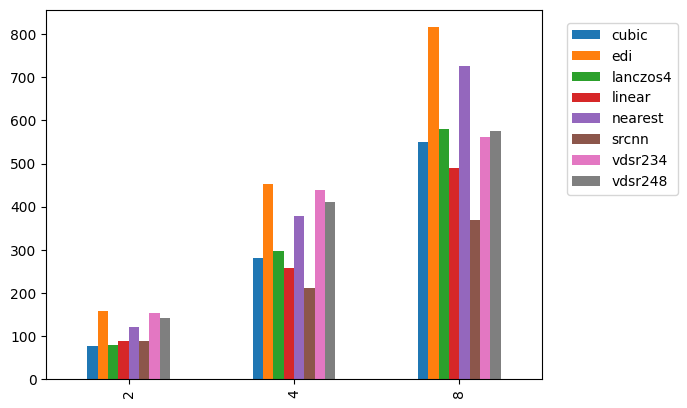

psnr


,cubic,edi,lanczos4,linear,nearest,srcnn,vdsr234,vdsr248
2,31.5751,27.9269,31.4080,30.7939,28.9951,30.2083,28.2776,28.6794
4,25.5227,22.9397,25.2772,25.7672,23.8610,26.2738,23.5837,23.8904
8,22.1370,20.0295,21.8994,22.5732,20.7270,23.7181,22.0613,21.9836


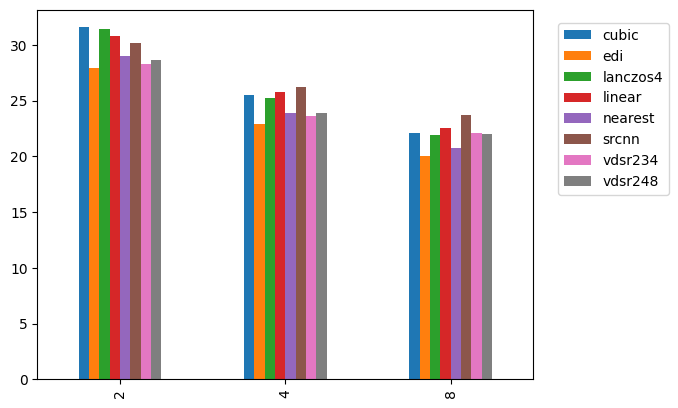

ssim


,cubic,edi,lanczos4,linear,nearest,srcnn,vdsr234,vdsr248
2,0.9150,0.8462,0.9103,0.8995,0.8927,0.9018,0.8761,0.8793
4,0.7584,0.6524,0.7464,0.7581,0.7179,0.7788,0.7302,0.7376
8,0.6171,0.5253,0.6044,0.6263,0.5618,0.6345,0.6129,0.6134


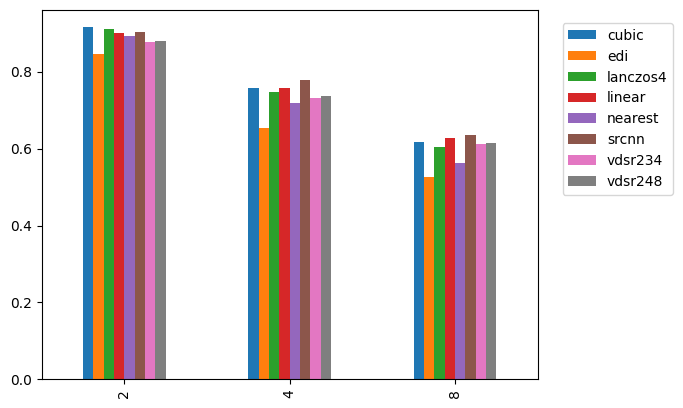

fsim


,cubic,edi,lanczos4,linear,nearest,srcnn,vdsr234,vdsr248
2,0.9987,0.9883,0.9986,0.9980,0.9983,0.9976,0.9967,0.9969
4,0.9634,0.9309,0.9632,0.9658,0.9633,0.9872,0.9581,0.9592
8,0.8928,0.8403,0.8850,0.9024,0.8924,0.9490,0.8918,0.8909


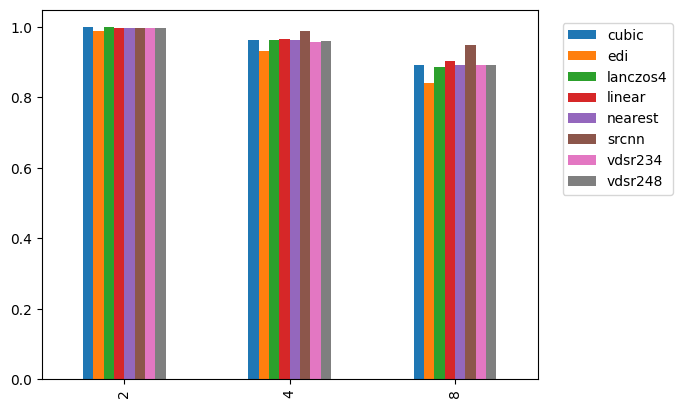

Manga109
mse


,cubic,edi,lanczos4,linear,nearest,srcnn,vdsr234,vdsr248
2,83.3153,225.0285,83.8235,110.6666,288.8653,101.2157,164.1474,150.0008
4,456.5997,844.7683,479.5152,442.4707,770.1251,340.1270,682.7911,620.1733
8,1111.6705,1662.5173,1162.1660,1011.8518,1507.7648,728.9291,1132.5476,1175.7170


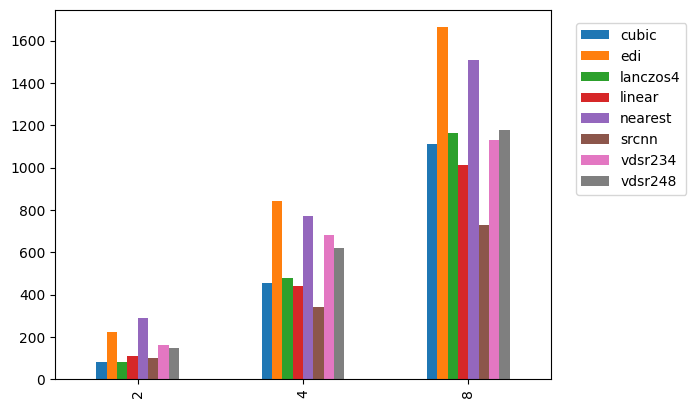

psnr


,cubic,edi,lanczos4,linear,nearest,srcnn,vdsr234,vdsr248
2,30.3817,25.4845,30.4531,28.8665,24.2987,29.0042,27.0608,27.5465
4,22.4381,19.4943,22.2284,22.4935,19.9296,23.5202,20.7380,21.1516
8,18.3107,16.4129,18.1105,18.6883,16.8926,20.0649,18.2357,18.0918


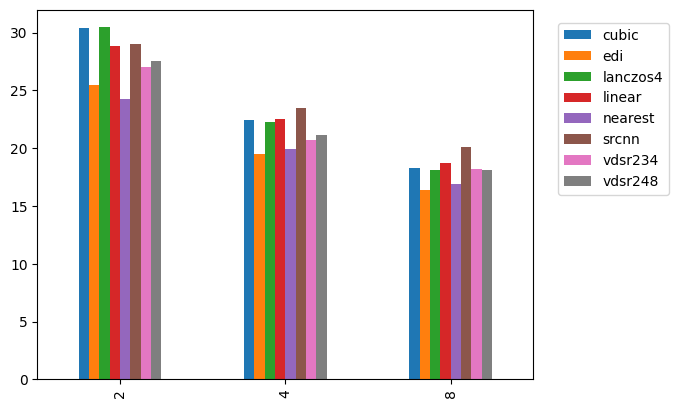

ssim


,cubic,edi,lanczos4,linear,nearest,srcnn,vdsr234,vdsr248
2,0.9375,0.8683,0.9329,0.9240,0.8721,0.9116,0.9058,0.9096
4,0.7668,0.6489,0.7434,0.7701,0.7175,0.7704,0.7452,0.7529
8,0.6017,0.4994,0.5764,0.6181,0.5733,0.6110,0.5984,0.5985


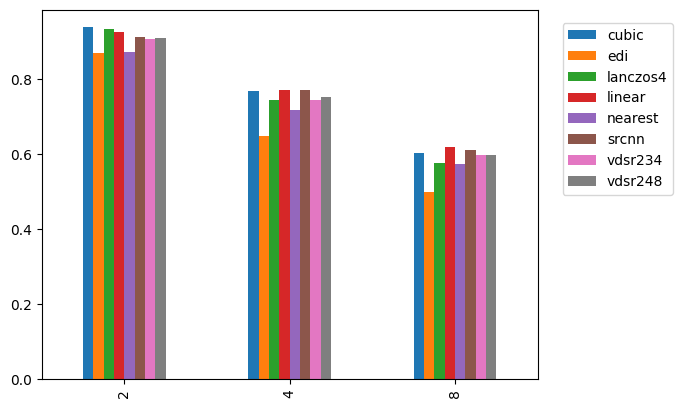

fsim


,cubic,edi,lanczos4,linear,nearest,srcnn,vdsr234,vdsr248
2,0.9935,0.9650,0.9933,0.9891,0.9720,0.9905,0.9890,0.9898
4,0.9244,0.8549,0.9186,0.9228,0.9106,0.9514,0.9142,0.9170
8,0.8027,0.7269,0.7835,0.8072,0.8008,0.8297,0.8029,0.8017


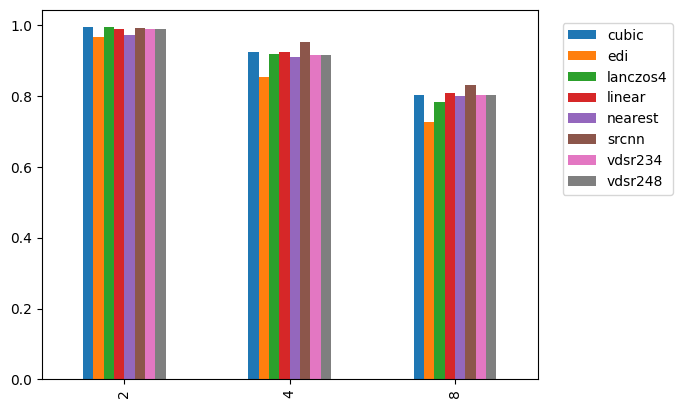

TESTIMG
mse


,cubic,edi,lanczos4,linear,nearest,srcnn,vdsr234,vdsr248
2,251.4517,351.6214,272.7362,239.8333,338.9618,239.9571,457.7638,464.3563
4,525.0049,645.8133,553.1764,463.1152,645.4434,378.5036,791.8104,758.9316
8,783.8941,991.3520,823.7557,691.2715,985.4571,522.8757,795.1079,805.3554


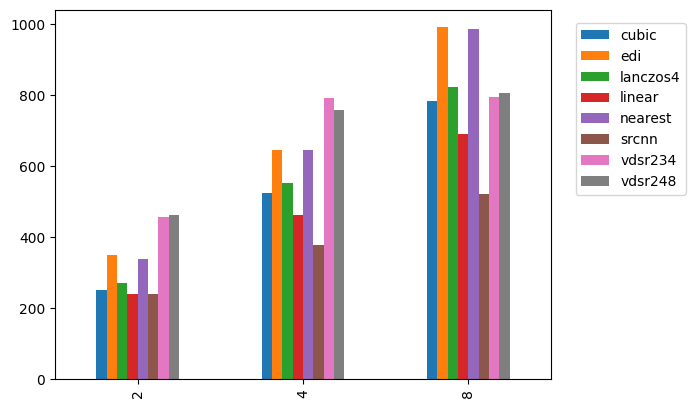

psnr


,cubic,edi,lanczos4,linear,nearest,srcnn,vdsr234,vdsr248
2,25.6814,24.0737,25.3397,25.8036,24.2401,25.6660,23.0726,23.0039
4,22.2770,21.1171,22.0457,22.7735,21.1879,23.5188,20.5186,20.7333
8,20.2992,18.9715,20.0831,20.8035,19.1445,21.9774,20.2396,20.2044


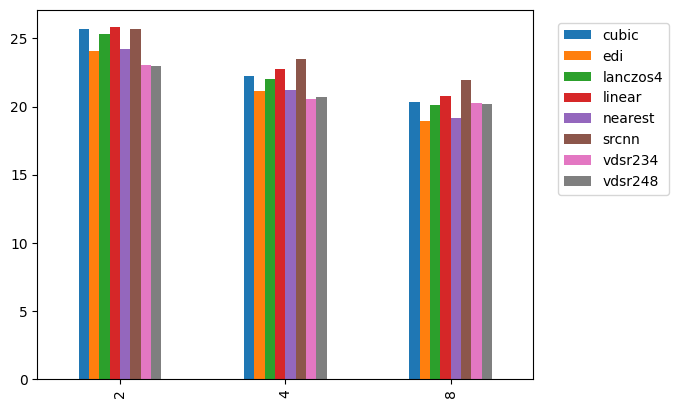

ssim


,cubic,edi,lanczos4,linear,nearest,srcnn,vdsr234,vdsr248
2,0.7834,0.6973,0.7732,0.7643,0.7375,0.8083,0.7345,0.7301
4,0.5714,0.4775,0.5614,0.5723,0.5222,0.6210,0.5424,0.5482
8,0.4417,0.3640,0.4342,0.4456,0.3727,0.4673,0.4391,0.4393


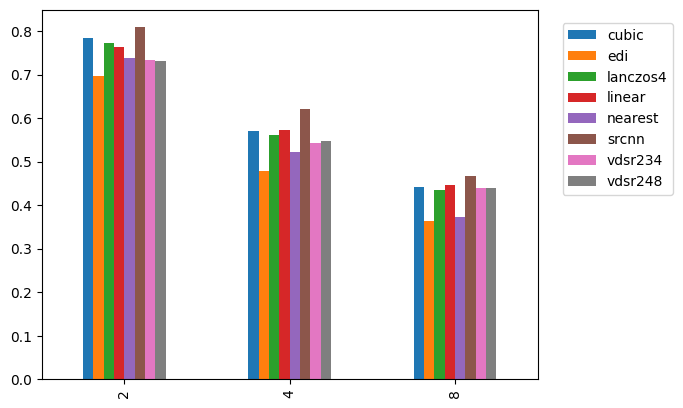

fsim


,cubic,edi,lanczos4,linear,nearest,srcnn,vdsr234,vdsr248
2,0.8989,0.8624,0.8939,0.8802,0.8851,0.9045,0.8578,0.8571
4,0.7966,0.7582,0.8004,0.7716,0.6820,0.7968,0.7891,0.7906
8,0.6713,0.6678,0.6769,0.6522,0.5225,0.6449,0.6742,0.6741


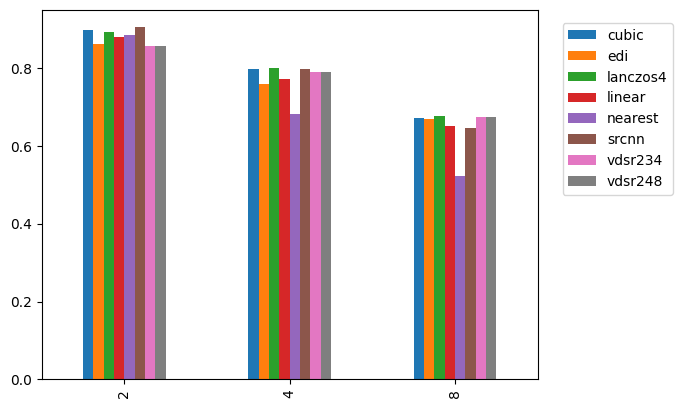

TheDuobaoTowerStele
mse


,cubic,edi,lanczos4,linear,nearest,srcnn,vdsr234,vdsr248
2,58.1561,168.0401,60.1576,72.1977,147.4729,74.0531,194.1430,144.2698
4,270.2252,623.1249,282.6509,268.1436,436.4238,201.9326,572.3284,530.6664
8,772.2079,1171.9121,824.2359,671.2388,935.9321,473.8470,786.4100,790.8291


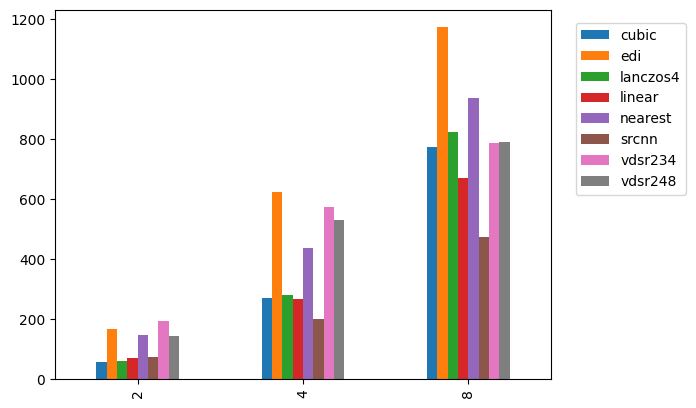

psnr


,cubic,edi,lanczos4,linear,nearest,srcnn,vdsr234,vdsr248
2,30.5697,25.9551,30.4241,29.6289,26.5781,29.4975,25.3306,26.6196
4,23.8983,20.2663,23.7037,23.9291,21.8085,25.1566,20.6415,20.9728
8,19.3366,17.5220,19.0526,19.9447,18.5007,21.4577,19.2583,19.2387


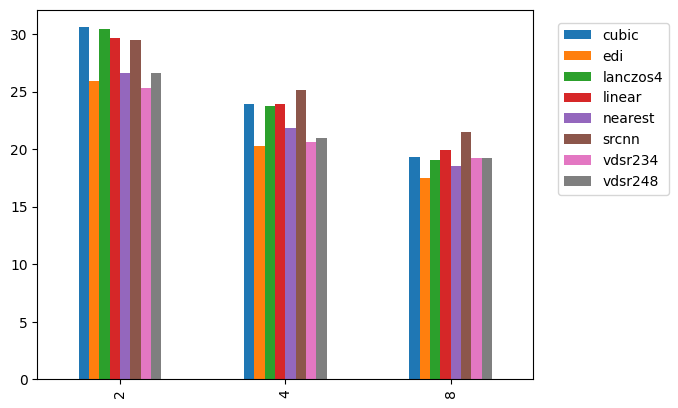

ssim


,cubic,edi,lanczos4,linear,nearest,srcnn,vdsr234,vdsr248
2,0.9140,0.8339,0.9081,0.9011,0.8619,0.9063,0.8511,0.8653
4,0.7310,0.5776,0.7122,0.7323,0.6771,0.7751,0.6923,0.7031
8,0.5101,0.4072,0.4767,0.5382,0.5048,0.5669,0.5075,0.5096


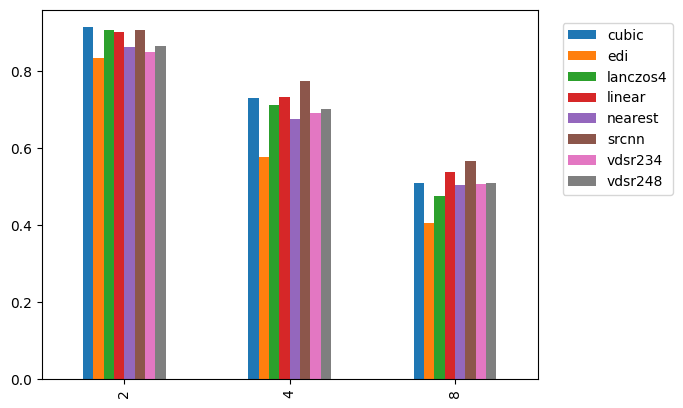

fsim


,cubic,edi,lanczos4,linear,nearest,srcnn,vdsr234,vdsr248
2,0.9942,0.9435,0.9942,0.9866,0.9751,0.9816,0.9783,0.9797
4,0.8820,0.8016,0.8715,0.8799,0.8703,0.9116,0.8526,0.8574
8,0.7212,0.6830,0.7077,0.7311,0.6730,0.7586,0.7213,0.7225


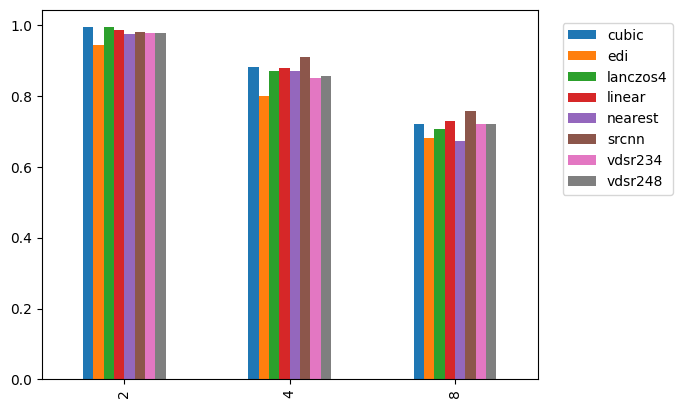

In [4]:
by_eval_algo = {}
for dataset, result in result_dataset_avg.items():
    by_eval_algo[dataset] = {}
    for algo, data in result.items():
        for eval_algo, scale in data.items():
            if not eval_algo in by_eval_algo[dataset]:
                by_eval_algo[dataset][eval_algo] = {}
            if not algo in by_eval_algo[dataset][eval_algo]:
                by_eval_algo[dataset][eval_algo][algo] = {}
            by_eval_algo[dataset][eval_algo][algo] = scale
            


pd.options.display.precision = 4
for dataset, result in by_eval_algo.items():
    print(dataset)
    for algo, data in result.items():
        print(algo)
        df = pd.DataFrame(data)
        display(df)
        df.plot(kind='bar')
        plt.legend(loc = (1.05, 0.5))
        plt.show()

# df.style.highlight_max(color="yellow")

# fig, ax = plt.subplots(1,1)
# fig.set_size_inches(6,1)
# # fig.patch.set_visible(False)
# ax.axis('off')
# ax.axis('tight')
# ax.set_title("cubic")
# table = ax.table(cellText=df.values, colLabels=df.columns, loc='center')
# fig.show()
# fig = plt.figure(figsize=(18, 16), dpi= 80)
# ax = plt.subplot("131")
# ax.imshow(im_gt)
# ax.set_title("GT")